In [1]:
%run /Users/denis/Documents/Projects/scripts/init.ipy
# os.chdir(os.getcwd().replace('/pipeline/notebooks', ''));

In [2]:
def readGMT(infile):
    gmt = {}
    with open(infile) as openfile:
        for line in openfile.read().split('\n'):
            split_line = line.strip().split('\t')
            if split_line[0]:
                gmt[split_line[0]] = [x.split(',')[0] for x in split_line[2:]]
    return gmt

In [3]:
bp2018 = readGMT('/Users/denis/Downloads/GO_Biological_Process_2018.txt')
bp2017b = readGMT('/Users/denis/Downloads/GO_Biological_Process_2017b.txt')

In [4]:
len(bp2018)

5103

In [5]:
len(bp2017b)

10125

In [8]:
common_terms = list(set(bp2017b.keys()).intersection(set(bp2018.keys())))
len(common_terms)

3698

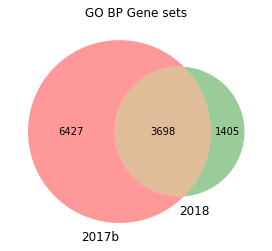

In [30]:
venn2([set(bp2017b.keys()), set(bp2018.keys())], set_labels=['2017b', '2018'])
plt.title('GO BP Gene sets');

In [11]:
from matplotlib_venn import venn2

In [32]:
overlap = {x: {'BP2018': len(bp2018[x]), 'BP2017b': len(bp2017b[x]), 'overlap': len(set(bp2018[x]).intersection(set(bp2017b[x])))} for x in common_terms}

In [33]:
overlap_dataframe = pd.DataFrame(overlap).T
overlap_dataframe.head()

,BP2017b,BP2018,overlap
cell junction assembly (GO:0034329),12,60,12
male meiosis I (GO:0007141),7,10,6
3'-UTR-mediated mRNA destabilization (GO:0061158),17,10,10
dorsal aorta morphogenesis (GO:0035912),13,7,7
strand invasion (GO:0042148),49,7,7


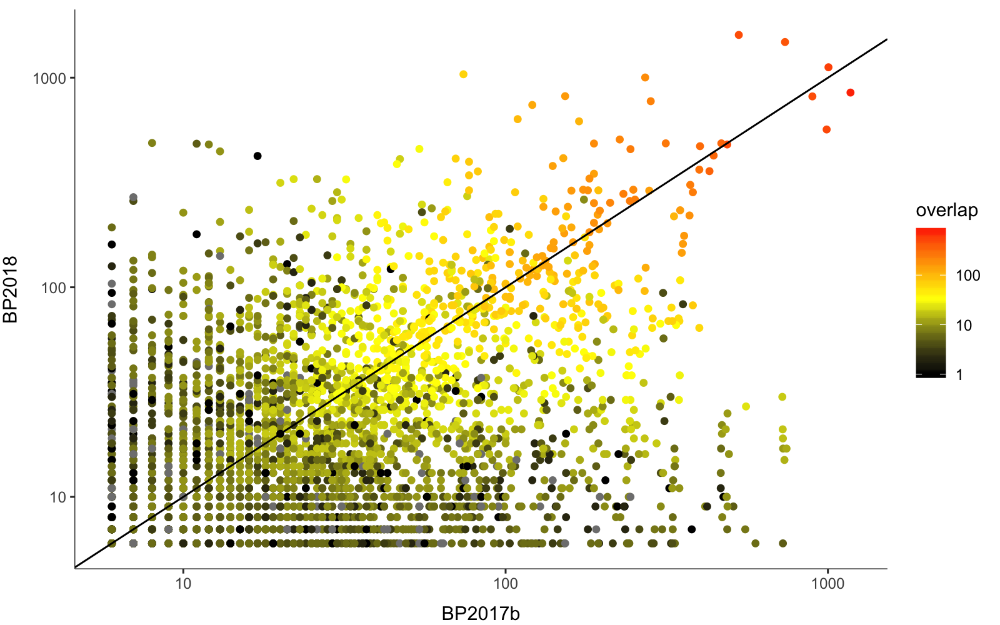

In [41]:
%%R -i overlap_dataframe -h 1000 -w 1600 -r 200
#ticks <- seq()
ggplot(overlap_dataframe, aes(x=BP2017b, y=BP2018, color=overlap)) +
geom_point() +
#facet_wrap(~, scales='free') +
#coord_flip() +
#scale_fill_manual(values=c('', '')) +
#scale_fill_gradient2(low='black', mid='yellow', high='red', trans='log10', midpoint='1') +
scale_color_gradient2(low='black', mid='yellow', high='red', trans='log10', midpoint=1.5) +
scale_x_log10() +
scale_y_log10() +
#scale_x_continuous(lim=c(min(ticks), max(ticks)), breaks=ticks, labels=ticks, trans='log10') +
#scale_y_continuous(lim=c(min(ticks), max(ticks)), breaks=ticks, labels=ticks, trans='log10') +
#ggtitle('') +
geom_abline(intercept=0, slope=1) +
#xlab('') +
#ylab('') +
#labs(title = '', x = '', y = '', color = '', fill='') +
#guides(fill=FALSE) +
theme_classic() +
theme(axis.title.x = element_text(vjust=-1), axis.title.y = element_text(vjust=2.5), axis.line = element_line(colour = 'black', size=0.2), strip.background = element_rect(color='black', fill='white', size=0))

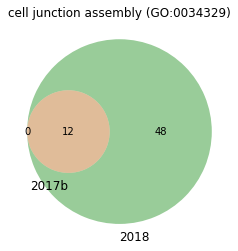

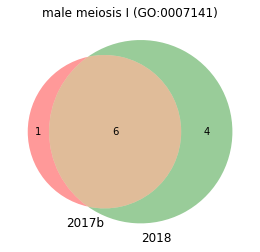

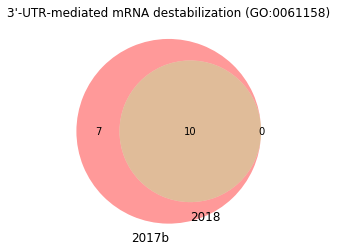

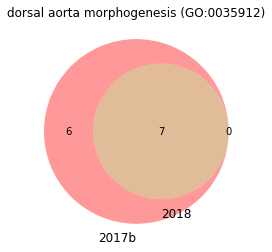

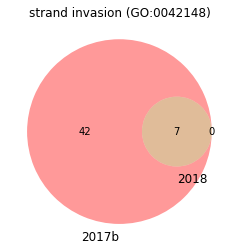

...

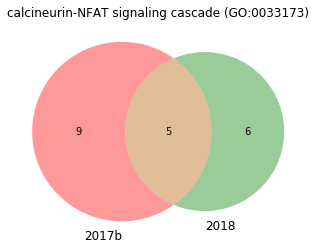

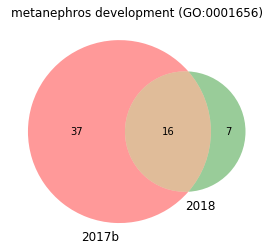

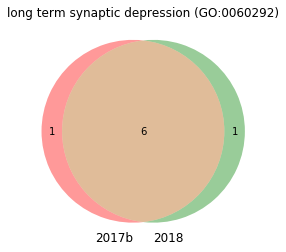

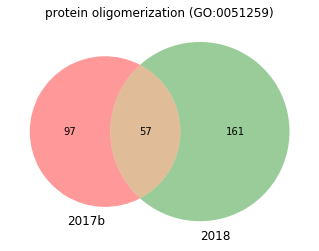

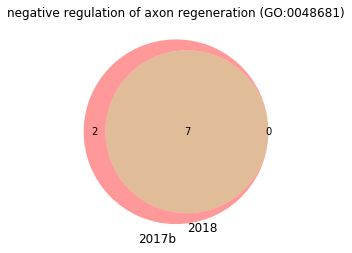

In [22]:
for term in common_terms[:500]:
    venn2([set(bp2017b[term]), set(bp2018[term])], set_labels=['2017b', '2018']);
    plt.title(term)
    plt.show()

In [46]:
print('\n'.join(bp2017b['regulation of interleukin-13 production (GO:0032656)']))

ACE2
LYN
CD83
SFTPD
TRAF3
CSK
LTF


In [47]:
print('\n'.join(bp2018['regulation of interleukin-13 production (GO:0032656)']))

LEF1
IFNL1
IL4
TSLP
TNFSF4
RARA
HLA-E
